# 🦡 Generate ảnh bằng LoRA Lửng Mật
> Chạy từng cell theo thứ tự. Không cần train lại — LoRA đã có trên Drive.

## 🔧 Bước 1: Fix torchvision
> Xóa bản cũ và cài bản tương thích với CUDA hiện tại. **Sau khi chạy xong → Restart session.**

In [1]:
# Xóa torchvision cũ bị conflict
import subprocess, sys

print("🗑️  Xóa torchvision cũ...")
subprocess.run([sys.executable, "-m", "pip", "uninstall", "-y", "torchvision"], capture_output=True)

import torch
cuda_ver = torch.version.cuda.replace(".", "")[:3]  # vd: "130"
torch_ver = torch.__version__
print(f"torch   : {torch_ver}")
print(f"CUDA    : {torch.version.cuda}")
print(f"cuda tag: cu{cuda_ver}")

print(f"\n⬇️  Cài torchvision nightly cho cu{cuda_ver}...")
result = subprocess.run(
    [sys.executable, "-m", "pip", "install", "-q", "torchvision",
     "--index-url", f"https://download.pytorch.org/whl/nightly/cu{cuda_ver}"],
    capture_output=True, text=True
)
print(result.stdout[-500:] if result.stdout else "")
print(result.stderr[-300:] if result.stderr else "")

print("\n✅ Xong! Bây giờ: Runtime → Restart session → chạy tiếp Bước 2")

🗑️  Xóa torchvision cũ...
torch   : 2.11.0+cu128
CUDA    : 12.8
cuda tag: cu128

⬇️  Cài torchvision nightly cho cu128...

ERROR: Could not find a version that satisfies the requirement torch==2.12.0.dev20260407 (from torchvision) (from versions: 2.12.0.dev20260408+cu128)
ERROR: No matching distribution found for torch==2.12.0.dev20260407


✅ Xong! Bây giờ: Runtime → Restart session → chạy tiếp Bước 2


## 📦 Bước 2: Cài thư viện
> Chạy sau khi đã Restart session ở Bước 1.

In [1]:
!pip install -q numpy==2.0.0
!pip install -q diffusers==0.31.0 transformers==4.44.0 peft==0.14.0 accelerate==0.33.0

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
accelerate 0.33.0 requires numpy<2.0.0,>=1.17, but you have numpy 2.0.0 which is incompatible.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.13.0.92 requires numpy>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
jaxlib 0.7.2 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
tobler 0.14.0 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.13.0.92 requires numpy>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
rasterio 1.5.0 requires numpy>=2, but you have numpy 1.26.4 which is incompatible.
shap 0.52.0 requires numpy>=2, but you have numpy 1.26

In [ ]:
# Kiểm tra import được không
import torch
from diffusers import StableDiffusionXLPipeline
print(f"✅ torch      : {torch.__version__}")
import diffusers, transformers
print(f"✅ diffusers  : {diffusers.__version__}")
print(f"✅ transformers: {transformers.__version__}")
print(f"✅ CUDA       : {torch.cuda.is_available()}")
print(f"✅ GPU        : {torch.cuda.get_device_name(0)}")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

✅ torch      : 2.11.0+cu128
✅ diffusers  : 0.31.0
✅ transformers: 4.44.0
✅ CUDA       : True
✅ GPU        : Tesla T4


## ☁️ Bước 3: Kết nối Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os, glob

LORA_DIR = "/content/drive/MyDrive/Loras/lung_mat/output/"
lora_files = sorted(glob.glob(f"{LORA_DIR}*.safetensors"))

if lora_files:
    print(f"✅ Tìm thấy {len(lora_files)} file LoRA:")
    for f in lora_files:
        size = os.path.getsize(f) / 1024**2
        print(f"  📄 {os.path.basename(f)} ({size:.0f} MB)")
    LATEST_LORA = os.path.basename(lora_files[3])
    print(f"\n🎯 Sẽ dùng: {LATEST_LORA}")
else:
    print("❌ Không tìm thấy file LoRA trong Drive!")
    print(f"   Kiểm tra lại đường dẫn: {LORA_DIR}")

## 🤖 Bước 4: Load model + LoRA
> Bước này mất ~2-3 phút để download model (~7GB).

In [ ]:
!apt install -y aria2 -q

import os
os.makedirs("/content/drive/MyDrive/models", exist_ok=True)
!aria2c "https://huggingface.co/Laxhar/noobai-XL-1.1/resolve/main/NoobAI-XL-v1.1.safetensors" \
    --console-log-level=warn \
    -c -s 16 -x 16 -k 10M \
    -d "/content/drive/MyDrive/models" \
    -o "noobai_xl_v1.1.safetensors"

print("✅ Download xong!")

print("✅ Download xong!")

In [ ]:
from diffusers import StableDiffusionXLPipeline
import torch

pipe = StableDiffusionXLPipeline.from_single_file(
    "/content/drive/MyDrive/models/noobai_xl_v1.1.safetensors",
    torch_dtype=torch.float16,
).to("cuda")

pipe.load_lora_weights(LORA_DIR, weight_name=LATEST_LORA)
print("✅ Sẵn sàng generate!")

In [6]:
# import torch
# from diffusers import StableDiffusionXLPipeline

# print("⬇️  Loading Illustrious XL...")
# pipe = StableDiffusionXLPipeline.from_pretrained(
#     "/content/drive/MyDrive/models/noobai_xl.safetensors",
#     torch_dtype=torch.float16,
#     use_safetensors=True,
# ).to("cuda")
# print("✅ Model loaded!")

# print(f"\n🔗 Loading LoRA: {LATEST_LORA}...")
# pipe.load_lora_weights(LORA_DIR, weight_name=LATEST_LORA)
# print("✅ LoRA loaded!")

⬇️  Loading Illustrious XL...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


model_index.json:   0%|          | 0.00/671 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/595 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/585 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/704 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

text_encoder_2/model.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/764 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

✅ Model loaded!

🔗 Loading LoRA: lung_mat-04.safetensors...
✅ LoRA loaded!


## 🎨 Bước 5: Generate ảnh
> Chỉnh prompt và các thông số tùy ý rồi chạy.

🎨 Đang generate ảnh...


  0%|          | 0/25 [00:00<?, ?it/s]

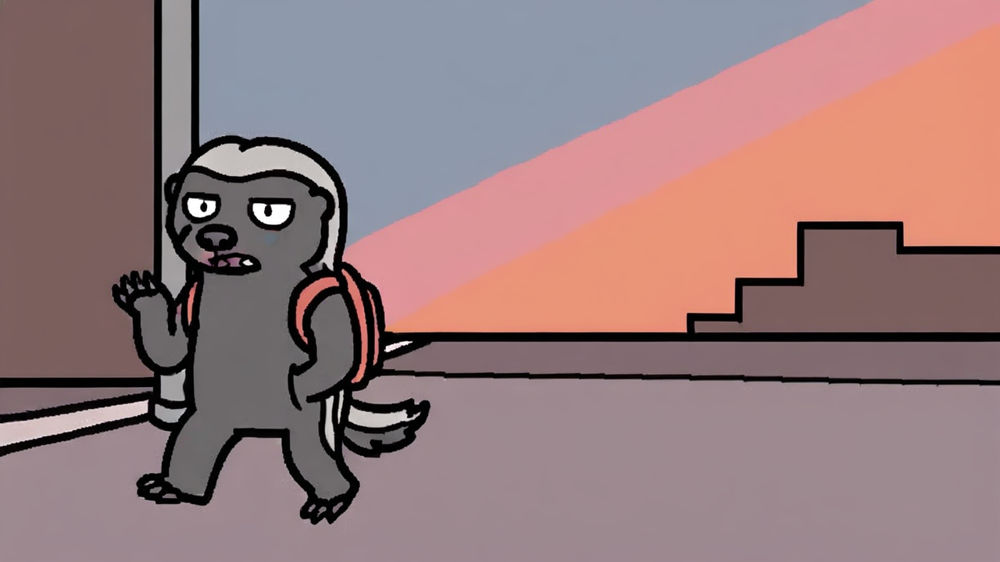


✅ Đã lưu: /content/drive/MyDrive/lung_mat_seed42.png


In [28]:
# ============================================
# ⚙️ CHỈNH THÔNG SỐ Ở ĐÂY
# ============================================

PROMPT = (
    "lung_mat_char, honey badger, anthro, walking home, carrying backpack, sunset background, residential street, tired expression, flat color, thick black outline, cartoon, simple illustration, 2d, solo, full body, small eyes, short snout"
)

NEGATIVE = (
    "realistic, 3d, photorealistic, blurry, multiple characters, character sheet, model sheet, reference sheet, collage, grid"
)

LORA_WEIGHT    = 0.8   # độ mạnh LoRA: 0.6 - 1.0
NUM_STEPS      = 25    # bước inference: 20-30
GUIDANCE_SCALE = 11    # CFG scale: 5-9
SEED           = 42    # đổi số này để ra ảnh khác
WIDTH          = 1280
HEIGHT         = 720

# ============================================

import torch
from IPython.display import display

generator = torch.Generator("cuda").manual_seed(SEED)

print("🎨 Đang generate ảnh...")
image = pipe(
    prompt=PROMPT,
    negative_prompt=NEGATIVE,
    width=WIDTH,
    height=HEIGHT,
    num_inference_steps=NUM_STEPS,
    guidance_scale=GUIDANCE_SCALE,
    generator=generator,
    cross_attention_kwargs={"scale": LORA_WEIGHT}
).images[0]

display(image)

# Lưu vào Drive
save_path = f"/content/drive/MyDrive/lung_mat_seed{SEED}.png"
image.save(save_path)
print(f"\n✅ Đã lưu: {save_path}")

## 🔁 Generate nhiều ảnh cùng lúc
> Chạy cell này để tạo nhiều ảnh với seed khác nhau.

🎨 Generating 4 ảnh...



  0%|          | 0/25 [00:00<?, ?it/s]

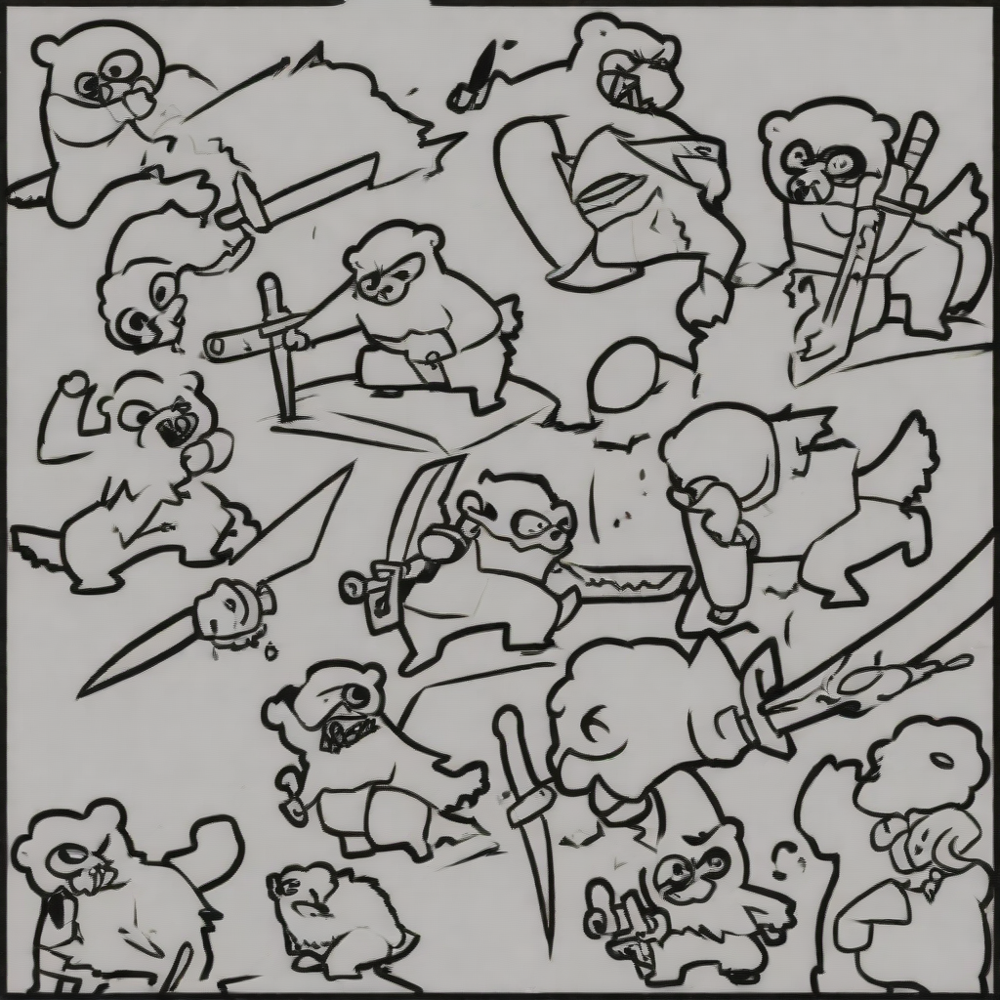

✅ Ảnh 1/4 — seed=42 — lưu tại Drive


  0%|          | 0/25 [00:00<?, ?it/s]

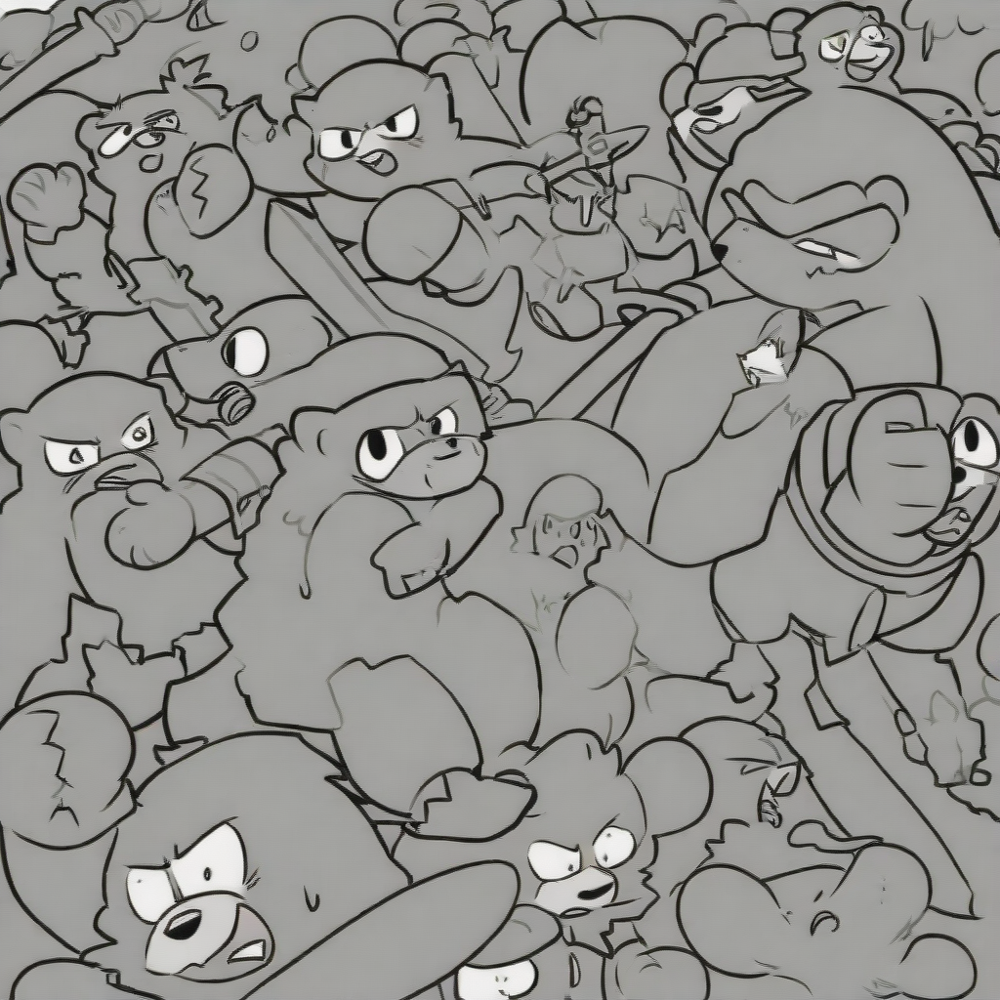

✅ Ảnh 2/4 — seed=43 — lưu tại Drive


  0%|          | 0/25 [00:00<?, ?it/s]

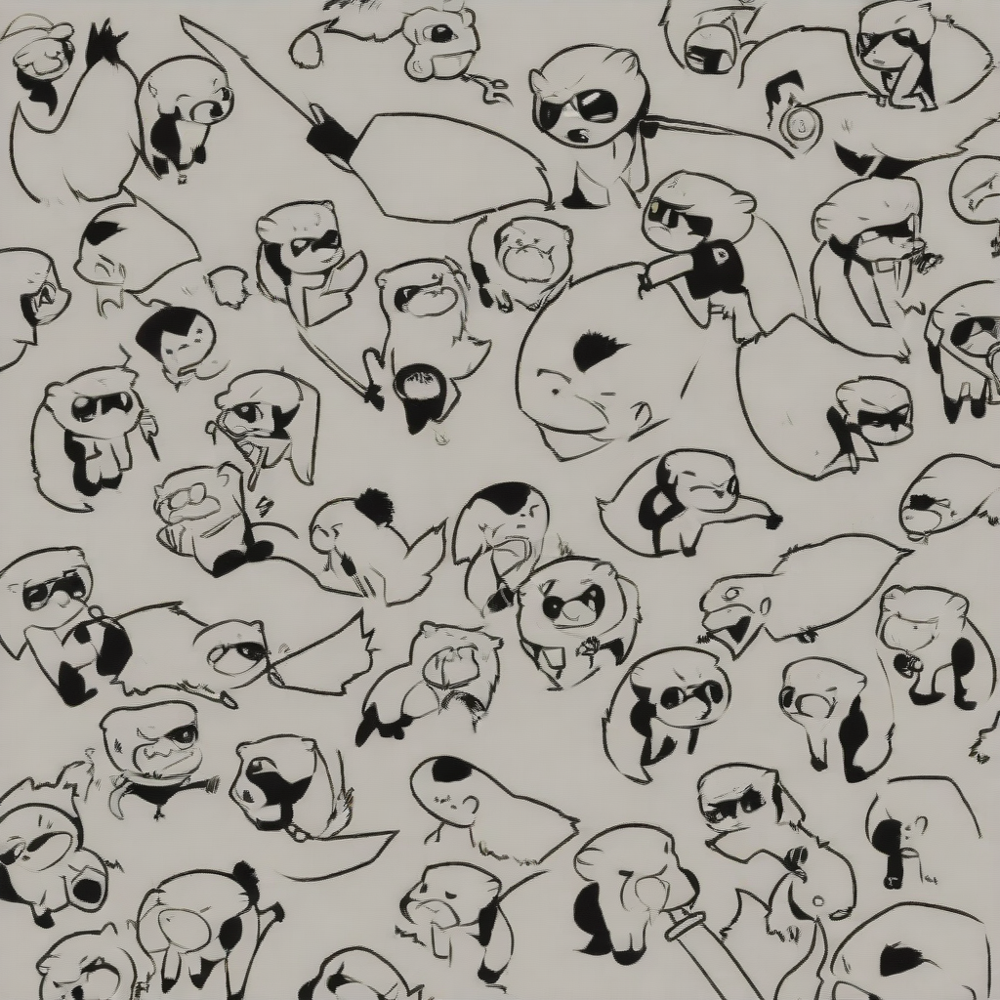

✅ Ảnh 3/4 — seed=44 — lưu tại Drive


  0%|          | 0/25 [00:00<?, ?it/s]

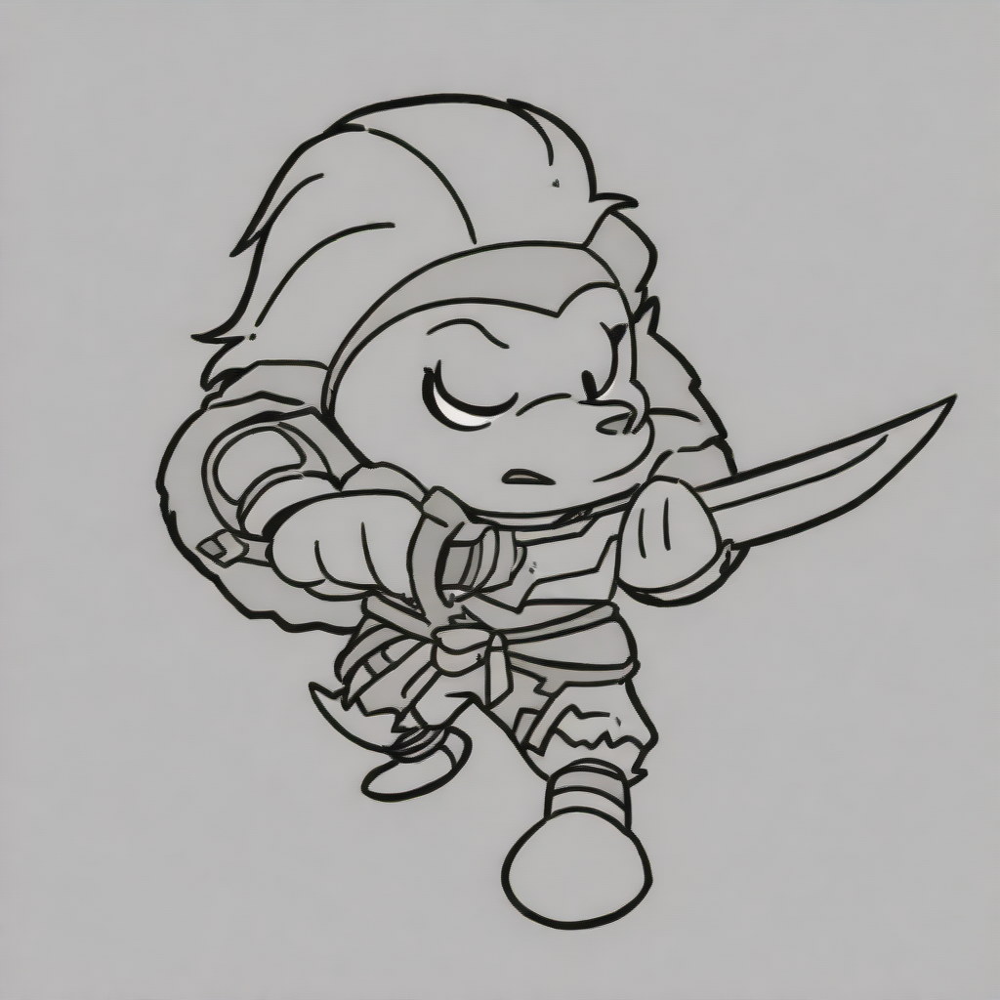

✅ Ảnh 4/4 — seed=45 — lưu tại Drive


In [ ]:
import torch
from IPython.display import display
import os

NUM_IMAGES = 4  # số ảnh muốn tạo

print(f"🎨 Generating {NUM_IMAGES} ảnh...\n")

for i in range(NUM_IMAGES):
    seed = SEED + i
    generator = torch.Generator("cuda").manual_seed(seed)

    image = pipe(
        prompt=PROMPT,
        negative_prompt=NEGATIVE,
        width=WIDTH,
        height=HEIGHT,
        num_inference_steps=NUM_STEPS,
        guidance_scale=GUIDANCE_SCALE,
        generator=generator,
        cross_attention_kwargs={"scale": LORA_WEIGHT}
    ).images[0]

    display(image)
    save_path = f"/content/drive/MyDrive/lung_mat_seed{seed}.png"
    image.save(save_path)
    print(f"✅ Ảnh {i+1}/{NUM_IMAGES} — seed={seed} — lưu tại Drive")